# Loading Data

In [1]:
import wasmshield.utils, wasmshield.plotting, random, os
train_set, test_set, wasm_bench_train_set, wasm_bench_test_set, obfuscated_train_set, obfuscated_test_set, msr_train_set, msr_test_set, llvm_obfuscated_train_set, llvm_obfuscated_test_set = wasmshield.utils.load_datasets()

100%|██████████| 3715/3715 [00:00<00:00, 8313.40it/s] 


In [2]:
import wasmshield.preprocessing
import matplotlib.pyplot as plt

files = {
    'taille<1KB': None,
    '1KB<=taille<100KB': None,
    '100KB<=taille<1MB': None,
    '1MB<=taille<10MB': None,
    '10MB<=taille<100MB': None,
}

while any([x is None for x in files.values()]):

    file = random.choice(wasm_bench_train_set)
    s = os.path.getsize(file)

    if files.get('taille<1KB') is None and  s<10**3 :
        print('found', s, 'taille<1KB')
        files['taille<1KB'] = file

    elif files.get('1KB<=taille<100KB') is None and 10**4<=s<10**5:
        print('found', s, '1KB<=taille<100KB')
        files['1KB<=taille<100KB'] = file

    elif files.get('100KB<=taille<1MB') is None and 10**5<=s<10**6:
        print('found', s, '100KB<=taille<1MB')
        files['100KB<=taille<1MB'] = file

    elif files.get('1MB<=taille<10MB') is None and 10**6<=s<10**7:
        print('found', s, '1MB<=taille<10MB')
        files['1MB<=taille<10MB'] = file

    elif files.get('10MB<=taille<100MB') is None and 10**7<=s<10**8:
        print('found', s, '10MB<=taille<100MB')
        files['10MB<=taille<100MB'] = file

files

found 47493 1KB<=taille<100KB
found 1922830 1MB<=taille<10MB
found 105033 100KB<=taille<1MB
found 233 taille<1KB
found 26697337 10MB<=taille<100MB


{'taille<1KB': 'datasets/wasm-bench/filtered/a2f730127bed481ee40615c88648595e567619d2fd44dbc4f693e66abf57bf87.wasm',
 '1KB<=taille<100KB': 'datasets/wasm-bench/filtered/c130eb9b7df1bcca31e54aa8966bb6119c9145f69093955c7ff3e16ee6f2a71b.wasm',
 '100KB<=taille<1MB': 'datasets/wasm-bench/filtered/be8222a33e18450c0a87195f01f7381b22cbfb322f37c4d59adf248f2139a7be.wasm',
 '1MB<=taille<10MB': 'datasets/wasm-bench/filtered/502ff7466d4d91d35d948af3600468f9d3bf1c3952e6684fc68d0842fee499af.wasm',
 '10MB<=taille<100MB': 'datasets/wasm-bench/filtered/01cd2c178b57d07f45132be806c96154c28b51f5959faa5b9309089aa286bc23.wasm'}

# Images of different sizes

Group Header


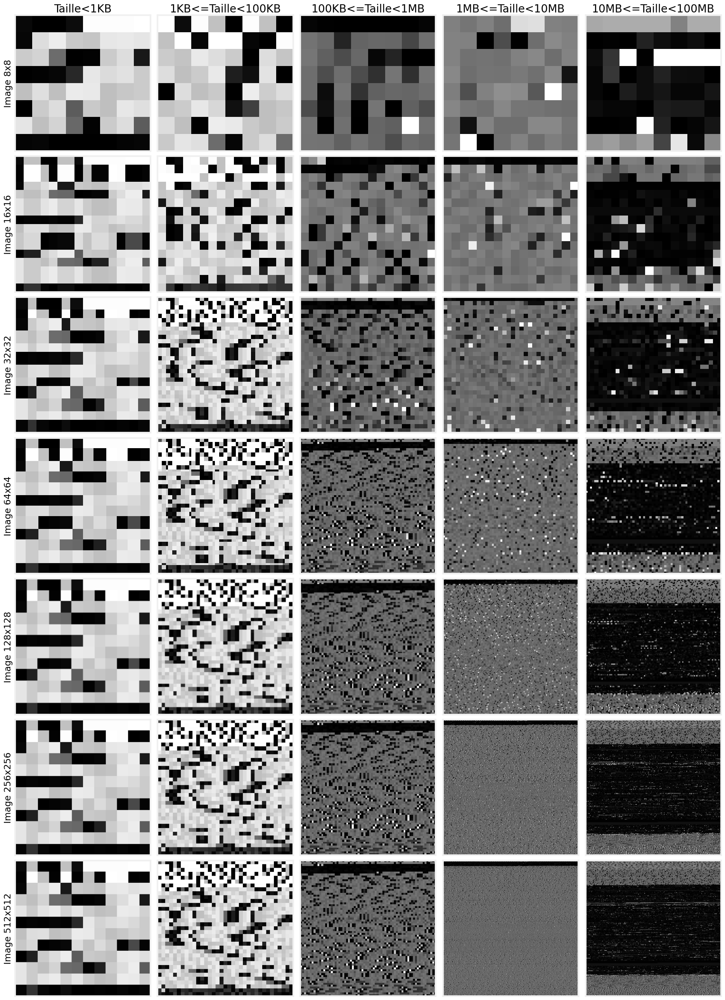

Group Code


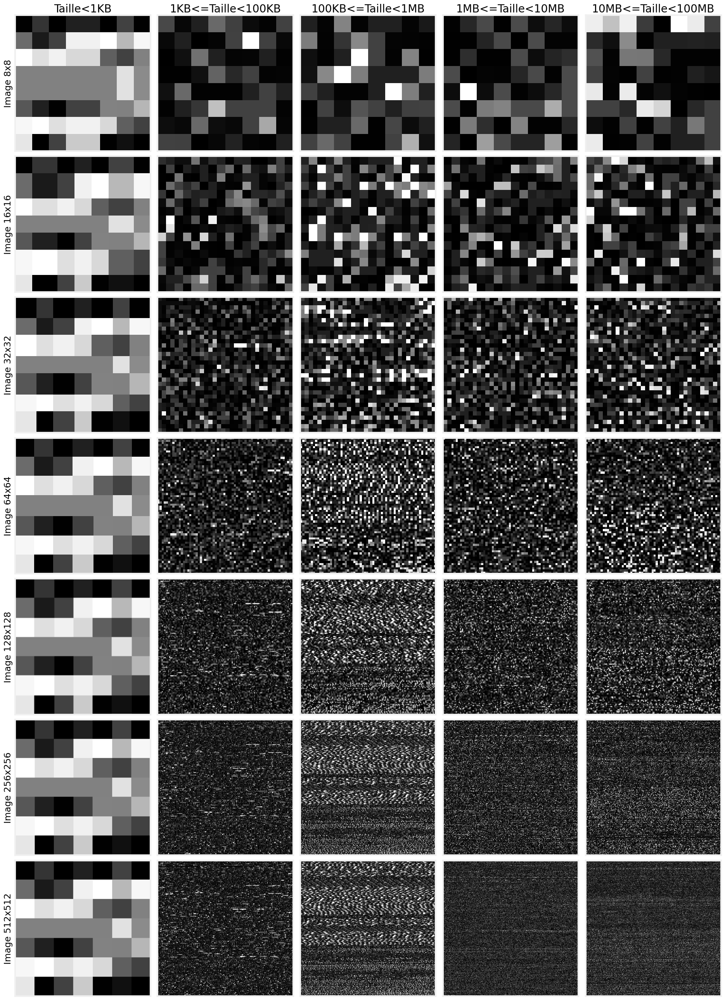

Group Data


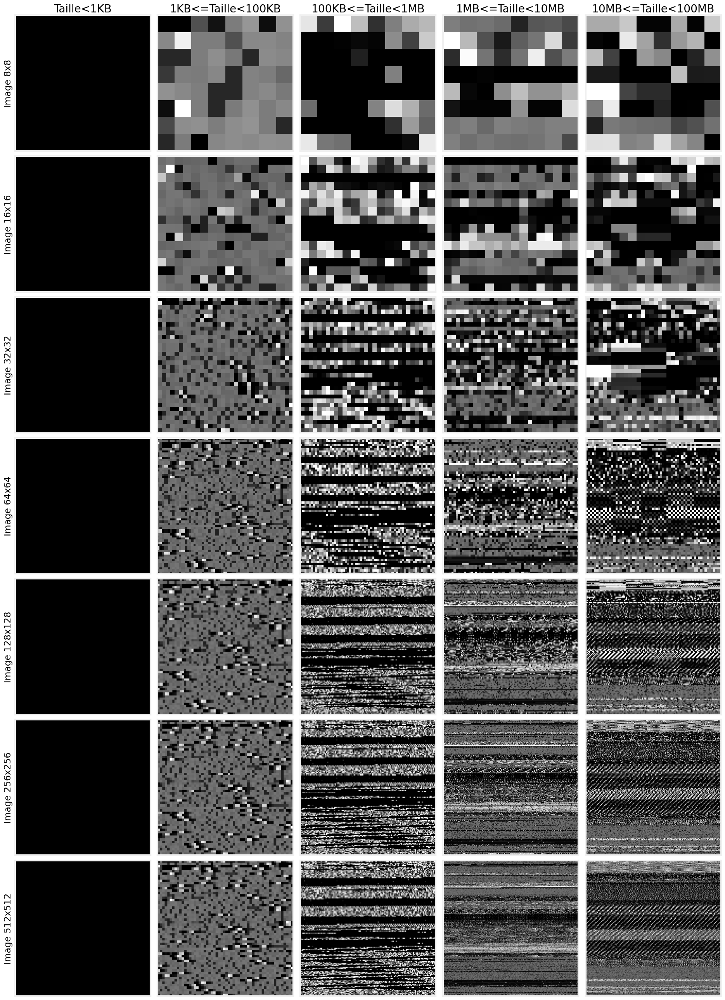

In [10]:
sizes = [8,16,32,64,128,256,512]

for group_id, group in enumerate(['Header', 'Code', 'Data']):

    print('Group', group)
    fig, axes = plt.subplots(nrows=len(sizes), ncols=len(files.keys()), figsize=(18, 25), facecolor='white', )
    fig.tight_layout(pad=-2)

    for size,ax in zip(sizes, axes[:, 0]):
        ax.grid(False)
        ax.set_ylabel(f"Image {size}x{size}")

    for filesize,ax in zip(files.keys(), axes[0, :]):
        ax.grid(False)
        ax.set_title(filesize.replace('taille','Taille'))

    for ax in axes.flatten():
        ax.axes.get_xaxis().set_ticks([])
        ax.axes.get_yaxis().set_ticks([])

    for row_id, (filesize, filename) in enumerate(files.items()):
        for col_id,size in enumerate(sizes):
            img = wasmshield.preprocessing.preprocess_image(
                filename,
                size=size,
                use_pil=True, compress=False
            )[group_id]
            ax = axes[col_id,row_id,]
            ax.imshow(img, cmap='gray',)

    plt.show()



# WObfuscator Images

In [13]:
import joblib

semantic_orig_dataset = 'datasets/wasim_dataset/WasmDataset/Cryptominer'
files = list(os.walk(semantic_orig_dataset))[0][-1]
files = [semantic_orig_dataset+'/'+file for file in files]

malware_filenames_test = joblib.load('evaluation_logs/malware_filenames_test')
malware_filenames_train = joblib.load('evaluation_logs/malware_filenames_train') + files
malware_filenames_train = malware_filenames_train
benign_filenames_train = joblib.load('evaluation_logs/benign_filenames_train')
benign_filenames_train = benign_filenames_train
benign_filenames_test = joblib.load('evaluation_logs/benign_filenames_test')

N = 10

#WOBFUSCATOR
malware_files_train = joblib.load('metadata/malware_files_train')
malware_files_test = joblib.load('metadata/malware_files_test')
benign_files_train = joblib.load('metadata/benign_files_train')
benign_files_test = joblib.load('metadata/benign_files_test')

malware_files = []
benign_files = []

min_size = 10**4*5
while len(malware_files)<N:
    f = random.choice(malware_files_train)
    s = os.path.getsize(f)
    if s>=min_size:
        malware_files.append(f)

while len(benign_files)<N:
    f = random.choice(benign_files_train)
    s = os.path.getsize(f)
    if s>=min_size:
        benign_files.append(f)



files_type='malware'


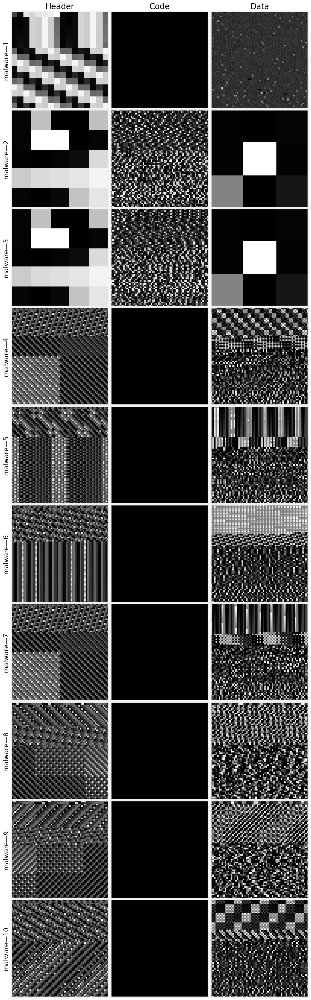

files_type='benign'


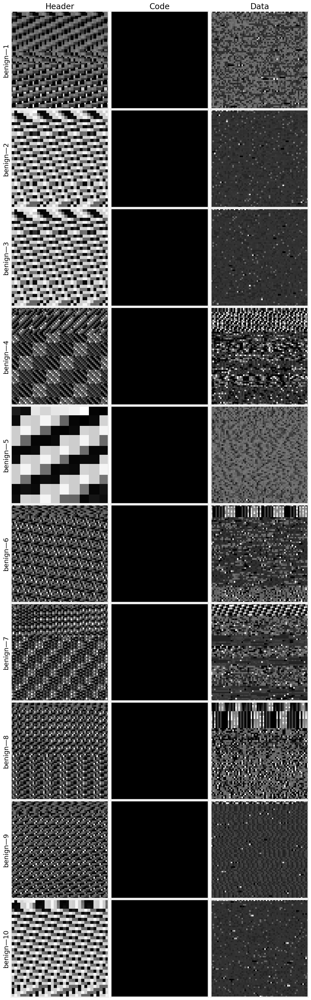

In [14]:
size = 64
groups = ['Header', 'Code', 'Data']

for files_type, files in [
    ('malware', malware_files), 
    ('benign', benign_files)
    ]:
    print(f'{files_type=}')
    fig, axes = plt.subplots(nrows=len(files), ncols=3, figsize=(10, 34), facecolor='white')
    fig.tight_layout(pad=-2.5)

    for ax_id,ax in enumerate(axes[:, 0]):
        ax.grid(False)
        ax.set_ylabel(f"{files_type}—{ax_id+1}")

    for group,ax in zip(groups, axes[0, :]):
        ax.grid(False)
        ax.set_title(f"{group}")

    for ax in axes.flatten():
        ax.axes.get_xaxis().set_ticks([])
        ax.axes.get_yaxis().set_ticks([])

    for group_id, group in enumerate(groups):
        for file_id, filename in enumerate(files):
            img = wasmshield.preprocessing.preprocess_image(
                filename,
                size=size,
                use_pil=True, compress=False
            )[group_id]
            ax = axes[file_id,group_id,]
            ax.imshow(img, cmap='gray',)
    
    plt.show()


# Emscripten Images

In [16]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def draw_files_horizontal(files, size = 128, group_mapping = { 0: 0, 1: 0, 2: 0, 3: 0, 4: 2, 5: 2, 6: 2, 7: 0, 8: 1, 9: 2, 10: 1, 11: 2, 12: 2,}, figsize=(20, 10), rows=[], cols=[], title='Plot', facecolor='white', use_pil=False, compress=False):
    
    nb_channels = len(set(group_mapping.values()))
    fig, axes = plt.subplots(nrows=len(files), ncols=nb_channels, figsize=figsize, facecolor=facecolor)
    fig.tight_layout(pad=0, h_pad=-7, w_pad=-2)
    if len(rows)==0:
        rows = [x.split('/')[-1] for x in files]
    if len(rows)==0:
        cols = [f'Channel {x}' for x in range(1,nb_channels+1)]

    pad = 5
    if nb_channels>1:
        for ax in (axes.flatten()):
            ax.grid(False)
            ax.axes.get_xaxis().set_ticks([])
            ax.axes.get_yaxis().set_ticks([])
        for ax, col in zip(axes[0], cols):
            ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                    xycoords='axes fraction', textcoords='offset points',
                    size='large', ha='center', va='baseline')
        for ax, row in zip(axes[:,0], rows):   
            ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                    xycoords=ax.yaxis.label, textcoords='offset points',
                    size='large', ha='right', va='center', rotation=90)
    
    for idx,file in enumerate(files):
        img = wasmshield.plotting.preprocess_image(file, size, group_mapping=group_mapping, use_pil=use_pil, compress=compress)
        for i,channel in enumerate(img):
            ax = axes.flatten()[(idx)*nb_channels+i]
            channel = Image.fromarray((
                        channel #* 255
                    ).astype(np.uint8), mode='L')
            ax.imshow(channel, interpolation='nearest', cmap='gray')
            ax.grid(None)
    fig.show()
    

['compiled_datasets/formai/optimisation_levels/FormAI_35150_mutate_optimizer_emcc_O0.wasm', 'compiled_datasets/formai/optimisation_levels/FormAI_35150_mutate_optimizer_emcc_O1.wasm', 'compiled_datasets/formai/optimisation_levels/FormAI_35150_mutate_optimizer_emcc_O2.wasm', 'compiled_datasets/formai/optimisation_levels/FormAI_35150_mutate_optimizer_emcc_O3.wasm', 'compiled_datasets/formai/optimisation_levels/FormAI_35150_mutate_optimizer_emcc_Os.wasm', 'compiled_datasets/formai/optimisation_levels/FormAI_35150_mutate_optimizer_emcc_Oz.wasm']


/var/folders/5b/wsyz4crx22bg_7tpsgbw3tzw0000gn/T/ipykernel_11736/2279901396.py:39: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


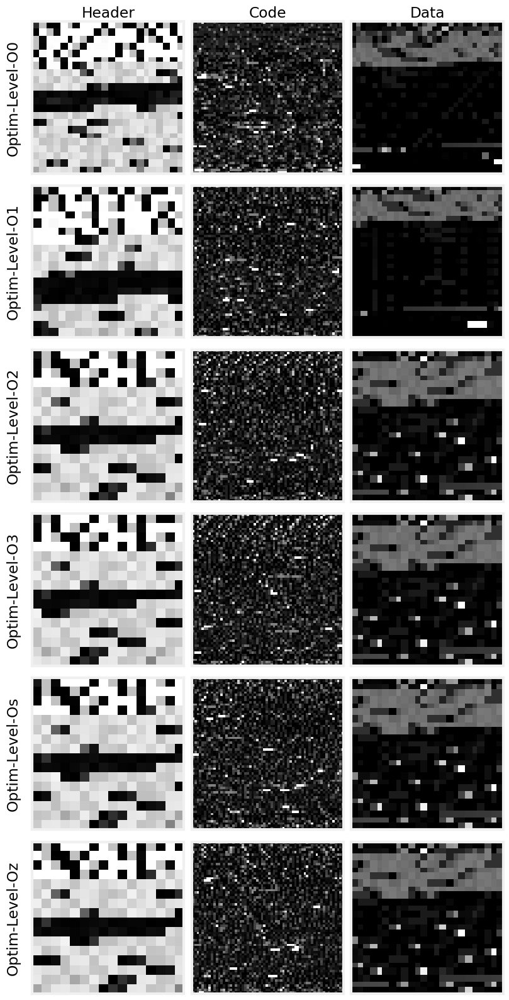

In [17]:
files = [x for x in random.choice(train_set)[-1]['path'].tolist() if '.wasm' in x]
print(files)
draw_files_horizontal(
    files,
    rows=['Optim-Level-'+f.split('_')[-1].replace('.wasm','') for f in files],
    figsize=(8,17),
    cols=[
        'Header', 'Code', 'Data'
    ],
    use_pil=True,
    compress=False,
    size=64
)


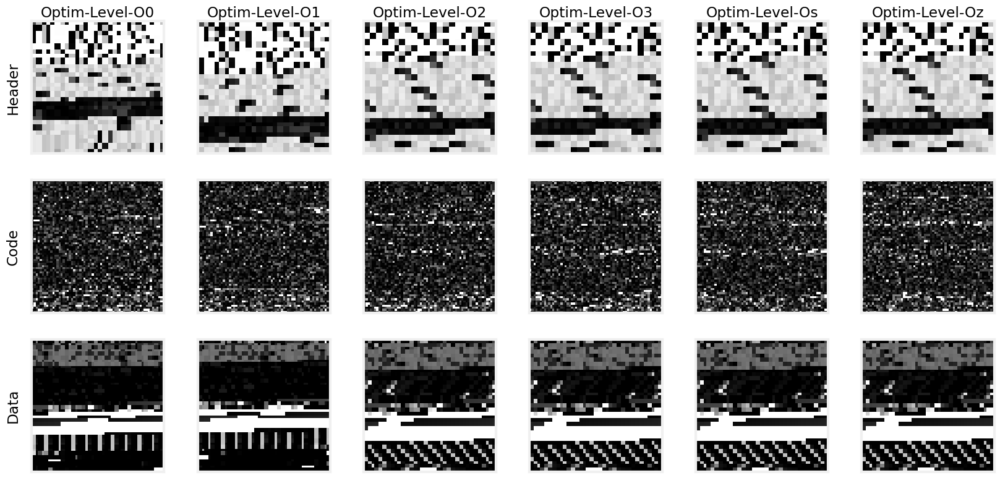

In [18]:
files = [x for x in random.choice(train_set)[-1]['path'].tolist() if '.wasm' in x]
wasmshield.plotting.draw_files(
    files,
    cols=['Optim-Level-'+f.split('_')[-1].replace('.wasm','') for f in files],
    figsize=(18,9),
    rows=[
        'Header', 'Code', 'Data'
    ],
    use_pil=True,
    compress=False,
    size=64
)


# Mutated Malware Images

/Users/walidthekraken/Documents/uqam/WALISM/wasmshield/plotting.py:94: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


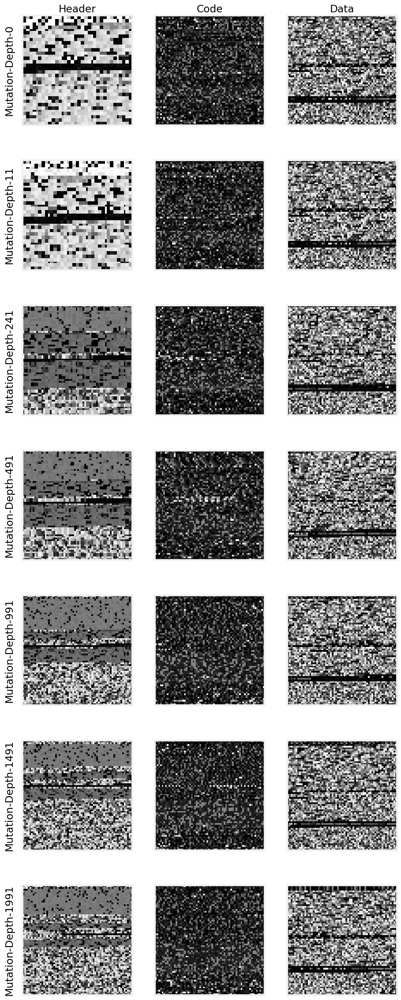

In [19]:
import joblib

l = joblib.load('evaluation_logs/results_malware')
L = list(l.keys())
idx = random.choice(list(range(len(l[0]))))
files = [l[i][idx] for i in [0, L[2], L[len(L)//8], L[len(L)//4], L[len(L)//2], L[len(L)//4*3], L[-1]]]
files

wasmshield.plotting.draw_files_horizontal(
    files,
    rows=['Mutation-Depth-'+f.split('&')[-1].replace('.wasm','') for f in ['0']+files[1:]],
    figsize=(9,23),
    cols=[
        'Header', 'Code', 'Data'
    ],
    use_pil=True,
    compress=False,
    size=64,
)


# Tigress Images

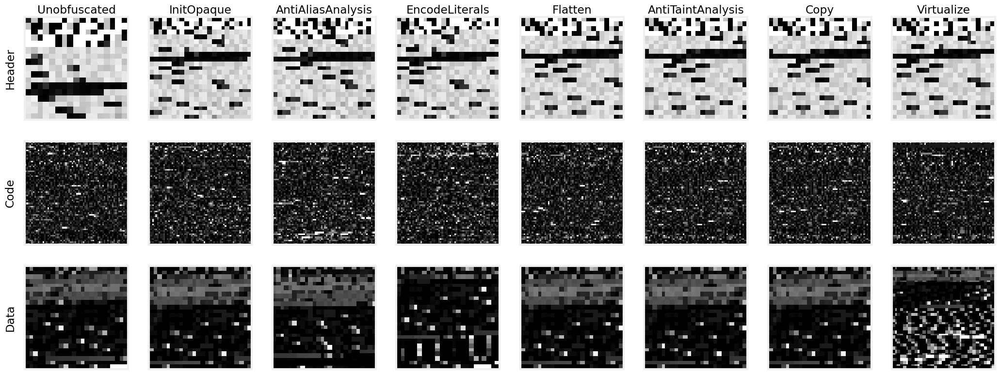

In [20]:
files, cols = [], []
clear, rec = random.choice(obfuscated_train_set)
files.append(clear), cols.append('Unobfuscated')
for a,b in rec.items():
    files.append(b), cols.append(a)

wasmshield.plotting.draw_files(
    files,
    cols=cols,
    figsize=(23,9),
    rows=[
        'Header', 'Code', 'Data'
    ],
    use_pil=True,
    compress=False,
    size=64
)